In [1]:
import numpy as np
import scipy.optimize as opt
import matplotlib.pyplot as plt

# Лабораторная работа 1

## Нежёсткие системы ОДУ

- Решение системы ОДУ методами Рунге-Кутта 1-4 порядков
- Решение системы ОДУ явными методами Адамса 2-4 порядков
- Решение системы ОДУ при помощи формулы дифференцирования назад 2-4 порядков

### Модель Лефевра-Пригожина "брюсселятор"

$\begin{align}
    \begin{cases}
        u' = A + u^2 v - (B + 1) u, \space u(0) = 1; \\
        v' = B u - u^2 v, \space v(0) = 1; \\
        A = 1, \space B \in [1, 5] \\
    \end{cases}
\end{align}$

# Методы Рунге-Кутты

## Таблицы Бутчера методов различных порядков

1.
| 0 | 0 |
|---|---|
|   | 1 |

2.
| 0   | 0   | 0 |
|-----|-----|---|
| 1/2 | 1/2 | 0 |
|     | 0   | 1 |

3.
| 0   | 0   | 0   | 0   |
|-----|-----|-----|-----|
| 1/2 | 1/2 | 0   | 0   |
| 1   | -1  | 2   | 0   |
|     | 1/6 | 2/3 | 1/6 |

4.
| 0   | 0   | 0   | 0   | 0   |
|-----|-----|-----|-----|-----|
| 1/2 | 1/2 | 0   | 0   | 0   |
| 1/2 | 0   | 1/2 | 0   | 0   |
| 1   | 0   | 0   | 1   | 0   |
|     | 1/6 | 1/3 | 1/3 | 1/6 |

In [4]:
def Runge_Kutta(f, x_0, t_1, t_2, N, a, b, c):
    # Time vector
    t = np.linspace(t_1, t_2, num=(N+1), endpoint=True)
    # Time step
    dt = (t_2 - t_1) / N

    # Initialize steps vector
    dim = len(x_0)
    x = np.zeros(shape=(N+1, dim))
    x[0] = x_0
    
    # Runge-Kutta method implication
    order = len(b) # Method order
    k = np.zeros(shape=(order, dim))

    for n in range(N):
        for i in range(order):
            k[i] = f(t[n] + dt * c[i], x[n] + dt * sum([a[i][j] * k[j] for j in range(i)]))
        x[n+1] = x[n] + dt * sum([b[j] * k[j] for j in range(order)])

    return t, x.T

# Методы Адамса

## Методы Адамса различных порядков

1. $y_{n+1} = y_n + h f(t_n, y_n)$

2. $y_{n+1} = y_n + h \left(\frac{3}{2} f(t_n, y_n) - \frac{1}{2} f(t_{n-1}, y_{n-1})\right)$

3. $y_{n+1} = y_n + h \left(\frac{23}{12} f(t_n, y_n) - \frac{16}{12} f(t_{n-1}, y_{n-1}) + \frac{5}{12} f(t_{n-2}, y_{n-2})\right)$

4. $y_{n+1} = y_n + h \left(\frac{55}{24} f(t_n, y_n) - \frac{59}{24} f(t_{n-1}, y_{n-1}) + \frac{37}{24} f(t_{n-2}, y_{n-2}) - \frac{9}{24} f(t_{n-3}, y_{n-3})\right)$

In [6]:
def Adams(F, x_0, t_1, t_2, N, order):
    # Time vector
    t = np.linspace(t_1, t_2, num=(N+1), endpoint=True)
    # Time step
    dt = (t_2 - t_1) / N

    # Initialize x and f vectors
    dim = len(x_0[0])
    x = np.zeros(shape=(N+1, dim))
    f = np.zeros(shape=(N+1, dim))
    for i in range(order):
        x[i] = x_0[i]
        f[i] = F(t[i], x_0[i])

    # Adams method implication
    if order == 2:
        for n in range(order, N+1):
            x[n] = x[n-1] + (dt / 2) * (3 * f[n-1] - f[n-2])
            f[n] = F(t[n], x[n])
    elif order == 3:
        for n in range(order, N+1):
            x[n] = x[n-1] + (dt / 12) * (23 * f[n-1] - 16 * f[n-2] + 5 * f[n-3])
            f[n] = F(t[n], x[n])
    elif order == 4:
        for n in range(order-1, N+1):
            x[n] = x[n-1] + (dt / 24) * (55 * f[n-1] - 59 * f[n-2] + 37 * f[n-3] - 9 * f[n-4])
            f[n] = F(t[n], x[n])
    else:
        raise RuntimeError("The order has to be 2, 3 or 4")

    return t, x.T

# Формулы дифференцирования назад

# ФДН различных порядков

1. $y_{n+1} = y_n + h f(t_{n+1}, y_{n+1})$

2. $y_{n+1} = \frac{4}{3} y_n - \frac{1}{3} y_{n-1} + \frac{2}{3} h f(t_{n+1}, y_{n+1})$

3. $y_{n+1} = \frac{18}{11} y_n - \frac{9}{11} y_{n-1} + \frac{2}{11} y_{n-2} + \frac{6}{11} h f(t_{n+1}, y_{n+1})$

4. $y_{n+1} = \frac{48}{25} y_n - \frac{36}{25} y_{n-1} + \frac{16}{25} y_{n-2} - \frac{3}{25} y_{n-3} + \frac{12}{25} h f(t_{n+1}, y_{n+1})$

In [8]:
def BDF(F, x_0, t_1, t_2, N, order):
    # Time vector
    t = np.linspace(t_1, t_2, num=N+1, endpoint=True)
    # Time step
    dt = (t_2 - t_1) / N

    # Initialize x vector
    dim = len(x_0[0])
    x = np.zeros(shape=(N+1, dim))
    for i in range(order):
        x[i] = x_0[i]

    # BDF method implication
    if order == 2:
        for n in range(order, N+1):
            func = lambda x_n: x_n - (4 * x[n-1] - x[n-2] + 2 * dt * F(t[n], x_n)) / 3
            x[n] = opt.fsolve(func, x[n-1])
    elif order == 3:
        for n in range(order, N+1):
            func = lambda x_n: x_n - (18 * x[n-1] - 9 * x[n-2] + 2 * x[n-3] + 6 * dt * F(t[n], x_n)) / 11
            x[n] = opt.fsolve(func, x[n-1])
    elif order == 4:
        for n in range(order-1, N+1):
            func = lambda x_n: x_n - (48 * x[n-1] - 36 * x[n-2] + 16 * x[n-3] - 3 * x[n-4] + 12 * dt * F(t[n], x_n)) / 25
            x[n] = opt.fsolve(func, x[n-1])
    else:
        raise RuntimeError("The order has to be 2, 3 or 4")

    return t, x.T

# Решение системы методами Рунге-Кутты

In [10]:
x_0 = [1, 1]
t_1 = 0
t_2 = 100
N = 100000
A = 1
B = [1, 2, 3, 4, 5]

def draw(t, x, B):
    plt.figure(figsize = (21, 9), dpi = 100)
    plt.title("Brusselator model reaction", fontsize = 30)

    plt.xlabel("t", fontsize = 24)
    plt.xticks(fontsize =  20, ha = "center", va = "top")

    plt.ylabel("x(t)", fontsize = 24)
    plt.yticks(fontsize = 20, rotation = 30, ha = "right", va = "top")

    plt.plot(t, x[0], linewidth = 1, color = "blue", label = f"$u$, B = {B}")
    plt.plot(t, x[1], linewidth = 1, color = "red", label = f"$v$, B = {B}")
    

    plt.legend(loc='best', fontsize=16)

    plt.grid (color="black", linewidth=0.45, linestyle="dotted")
    plt.minorticks_on()
    plt.grid (which="minor", color="grey", linewidth=0.25, linestyle="dashed")

    plt.show()

## 1 порядок

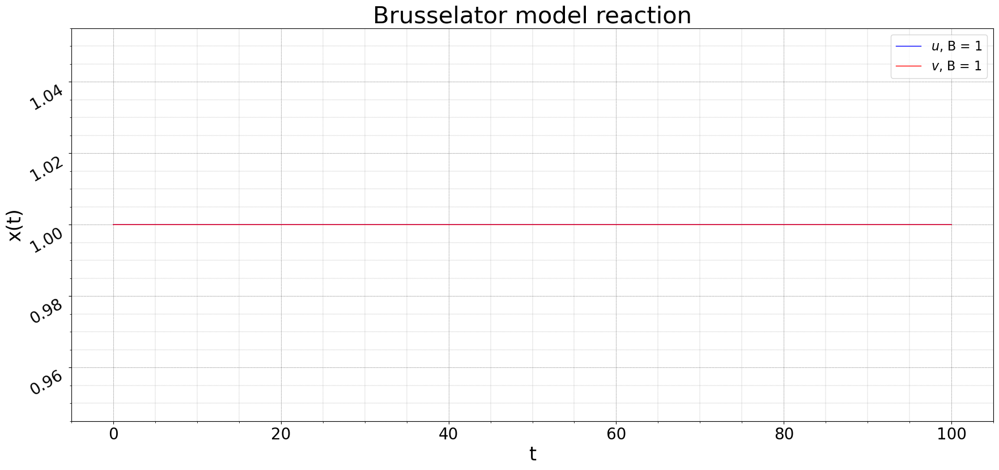

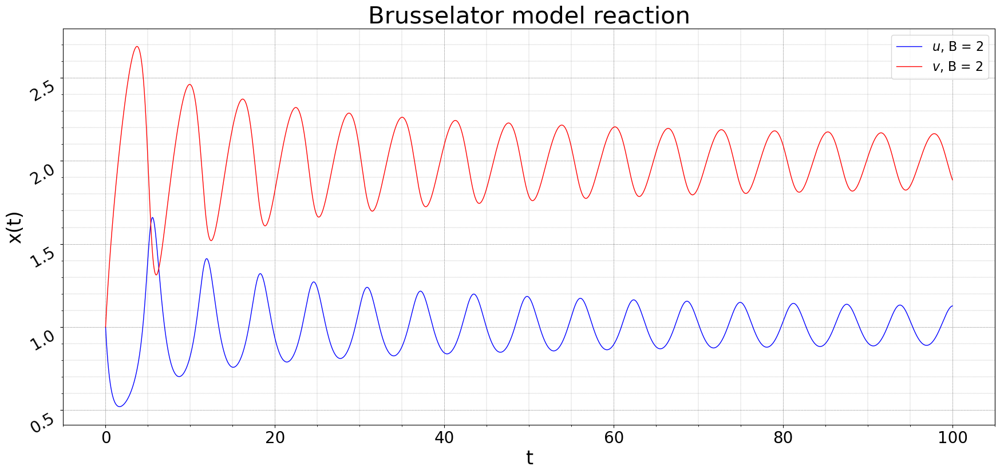

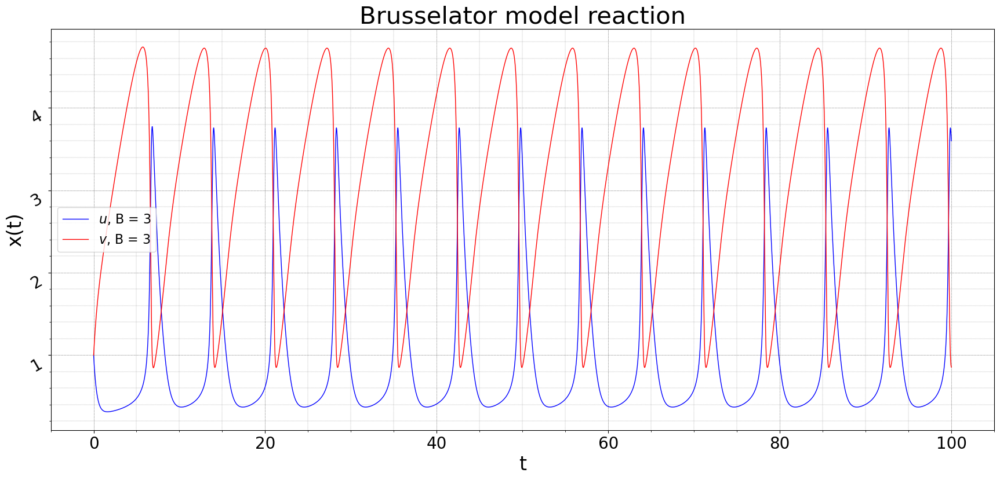

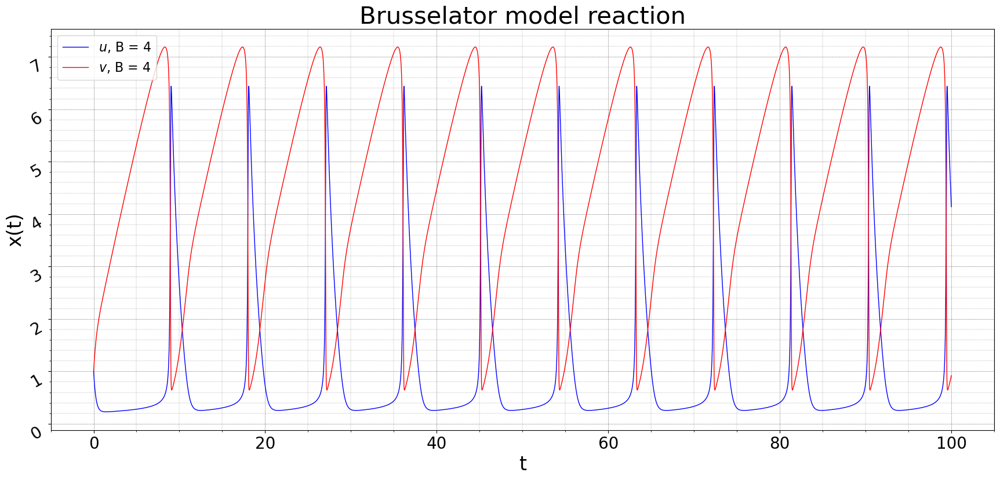

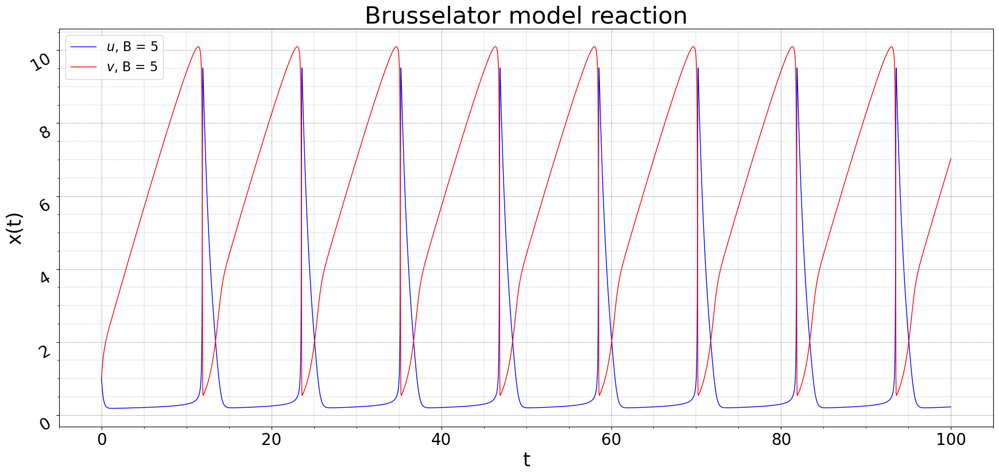

In [12]:
a = [[0.0]]
b = np.array([1.0])
c = np.array([0.0])

for elem in B:
    f = lambda t, x: np.array([A + x[0]**2 * x[1] - (elem + 1) * x[0], elem * x[0] - x[0]**2 * x[1]])
    t, x = Runge_Kutta(f, x_0, t_1, t_2, N, a, b, c)
    draw(t, x, elem)

## 2 порядок

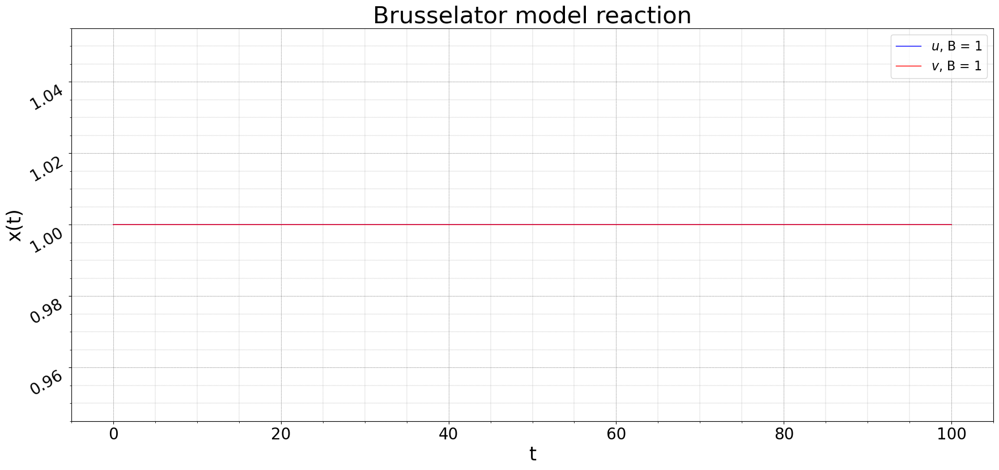

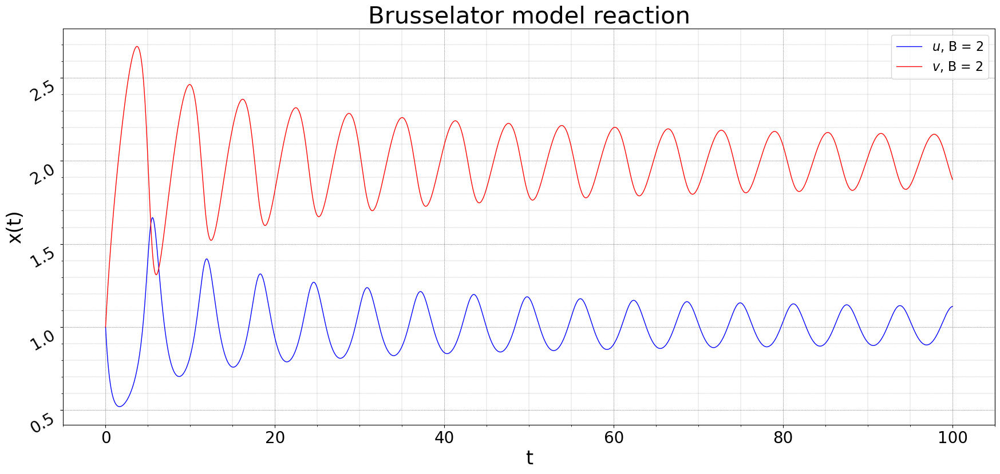

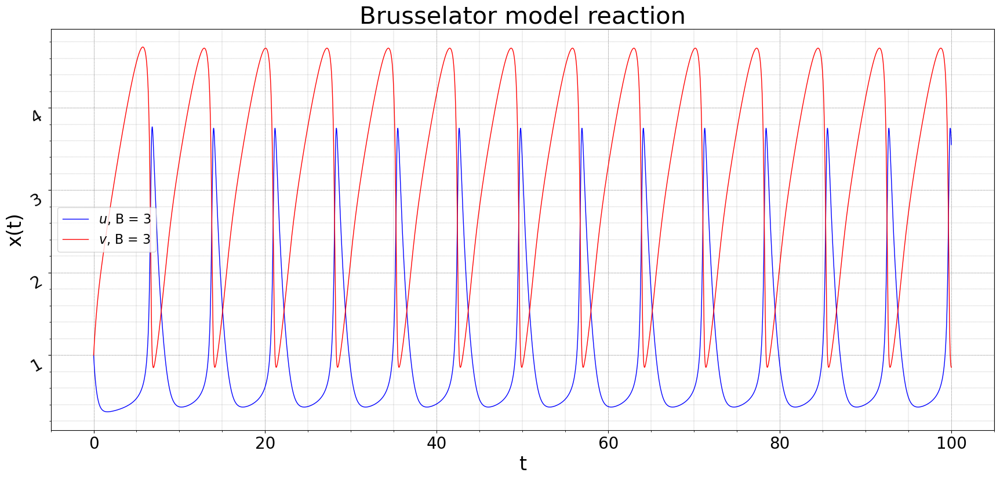

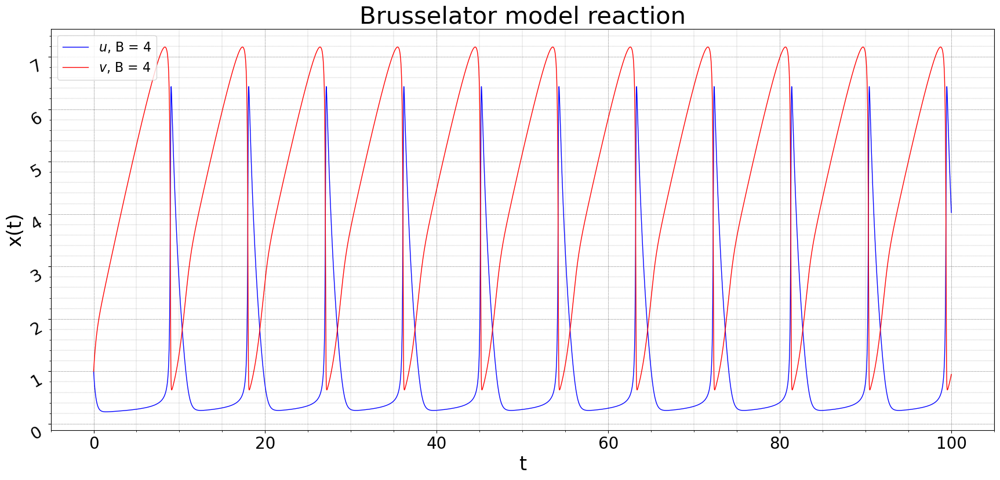

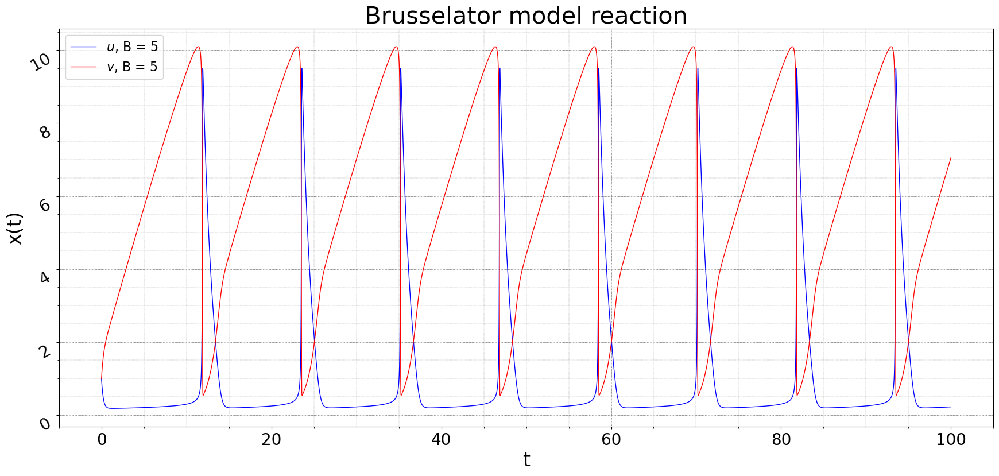

In [14]:
a = [[0.0, 0.0],
     [0.5, 0.0]]
b = np.array([0.0, 1.0])
c = np.array([0.0, 0.5])

for elem in B:
    f = lambda t, x: np.array([A + x[0]**2 * x[1] - (elem + 1) * x[0], elem * x[0] - x[0]**2 * x[1]])
    t, x = Runge_Kutta(f, x_0, t_1, t_2, N, a, b, c)
    draw(t, x, elem)

## 3 порядок

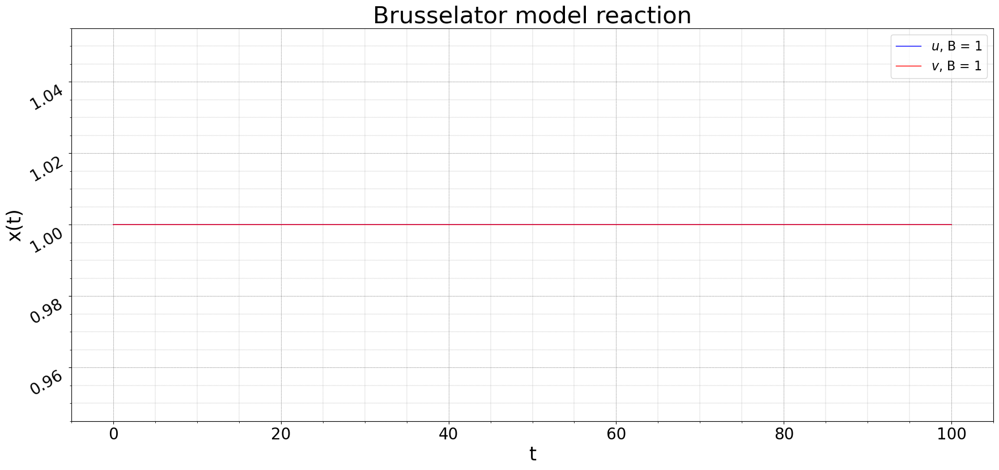

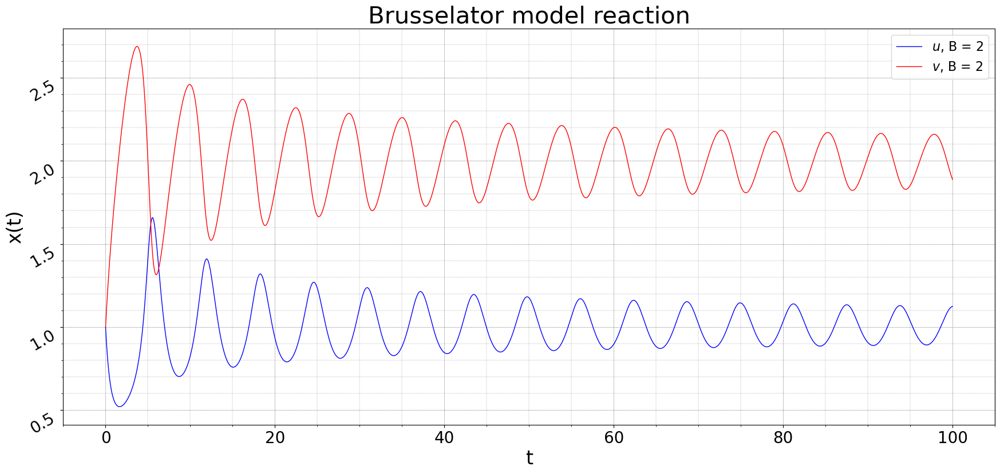

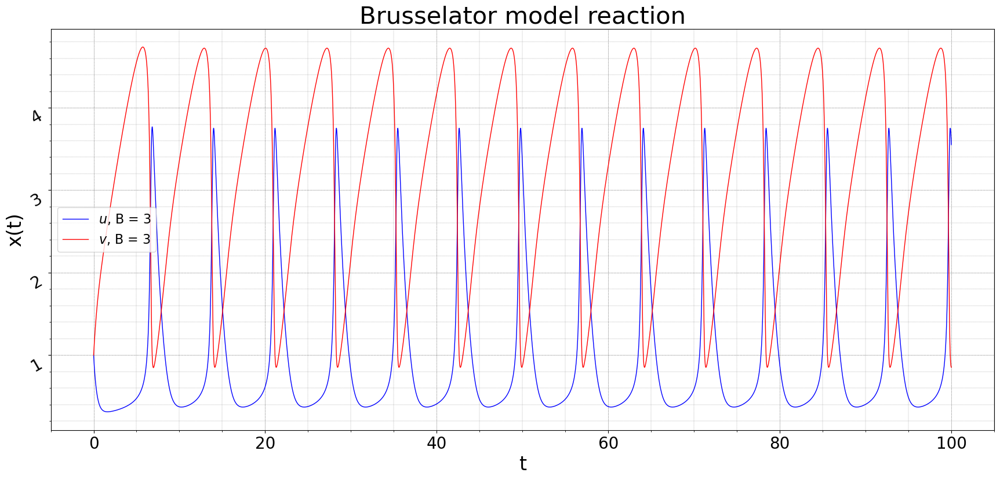

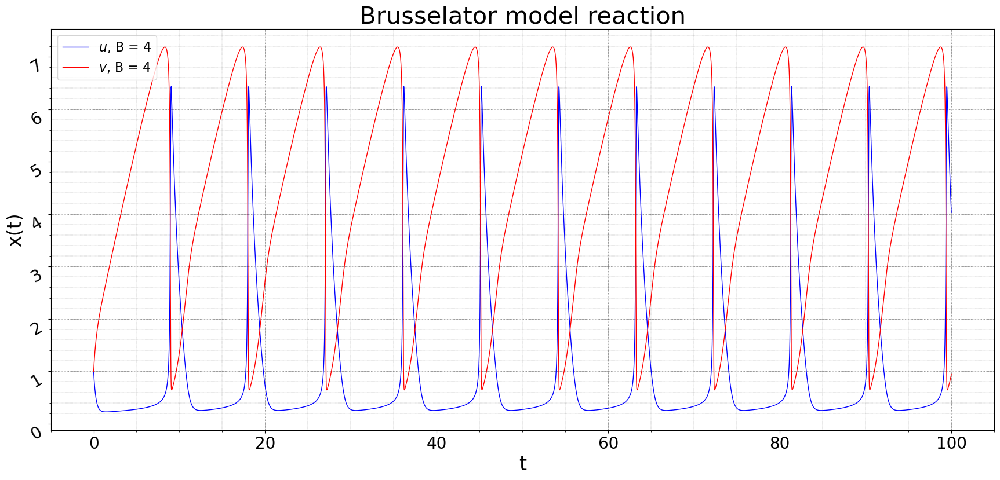

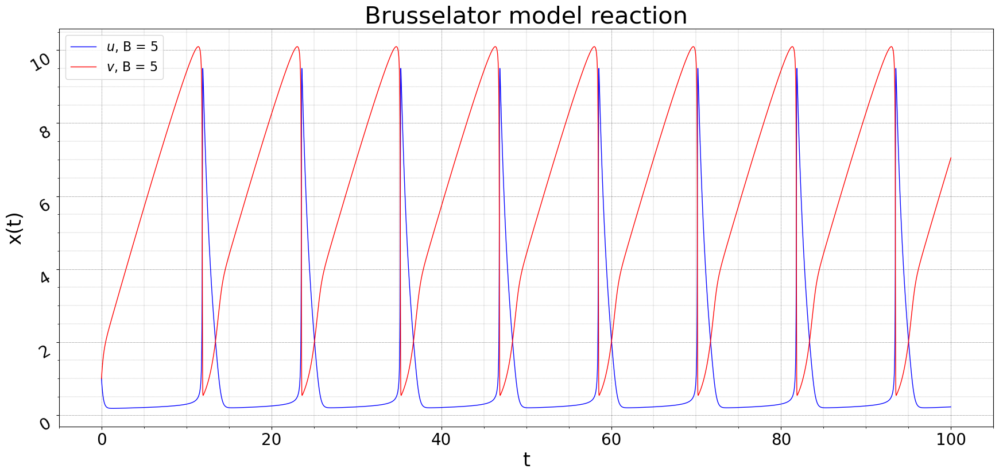

In [16]:
a = [[0.0, 0.0, 0.0],
     [0.5, 0.0, 0.0],
     [-1.0, 2.0, 0.0]]
b = np.array([1.0/6.0, 2.0/3.0, 1.0/6.0])
c = np.array([0.0, 0.5, 1.0])

for elem in B:
    f = lambda t, x: np.array([A + x[0]**2 * x[1] - (elem + 1) * x[0], elem * x[0] - x[0]**2 * x[1]])
    t, x = Runge_Kutta(f, x_0, t_1, t_2, N, a, b, c)
    draw(t, x, elem)

## 4 порядок

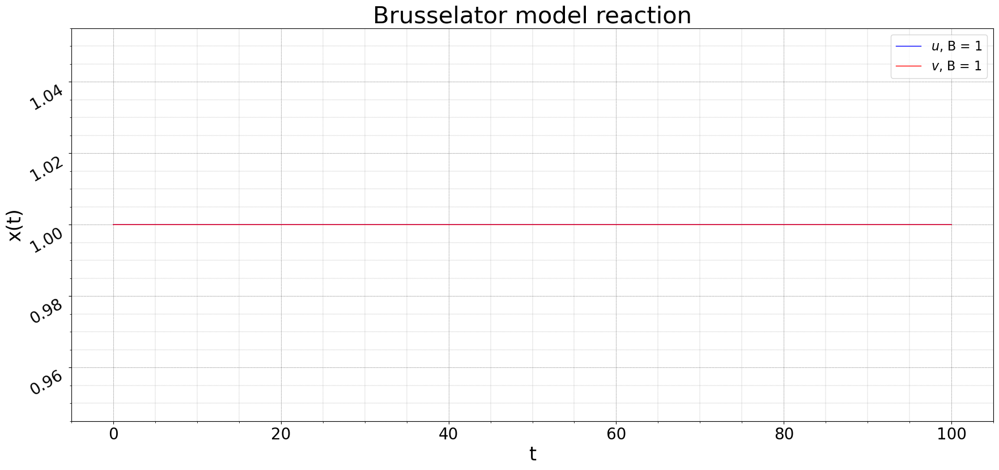

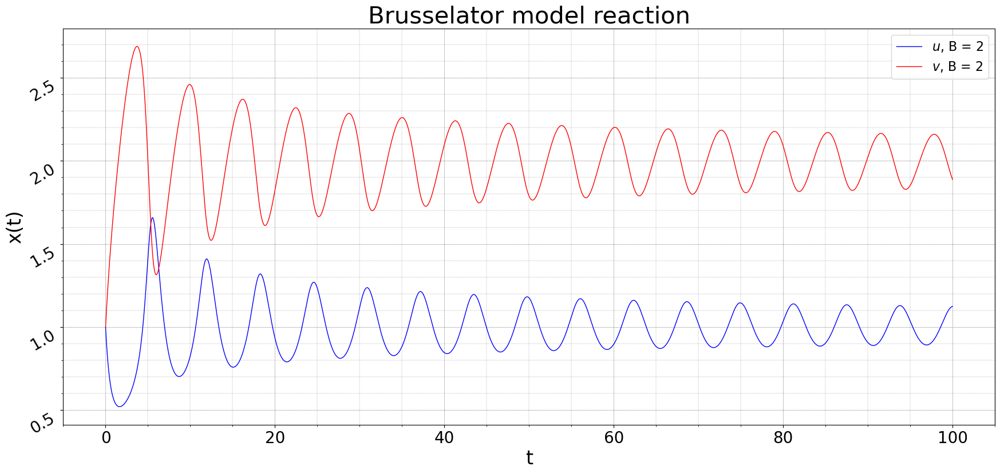

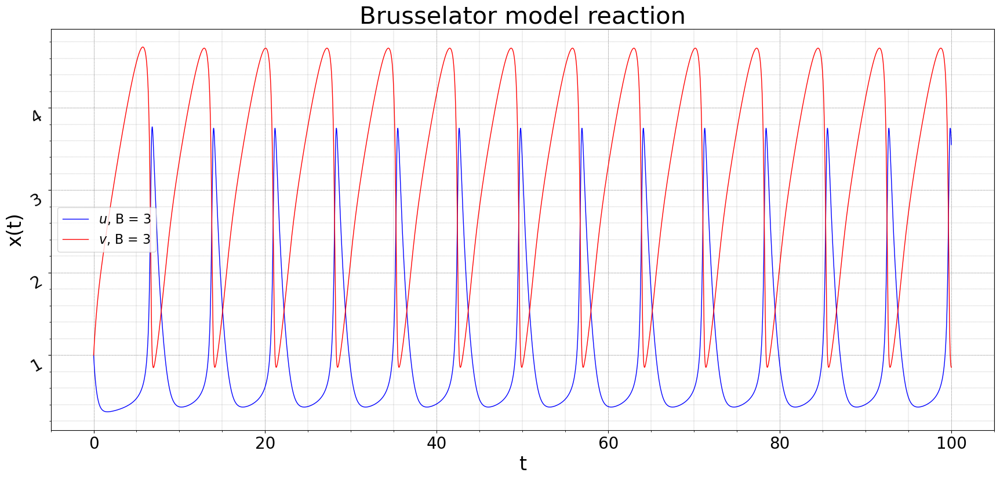

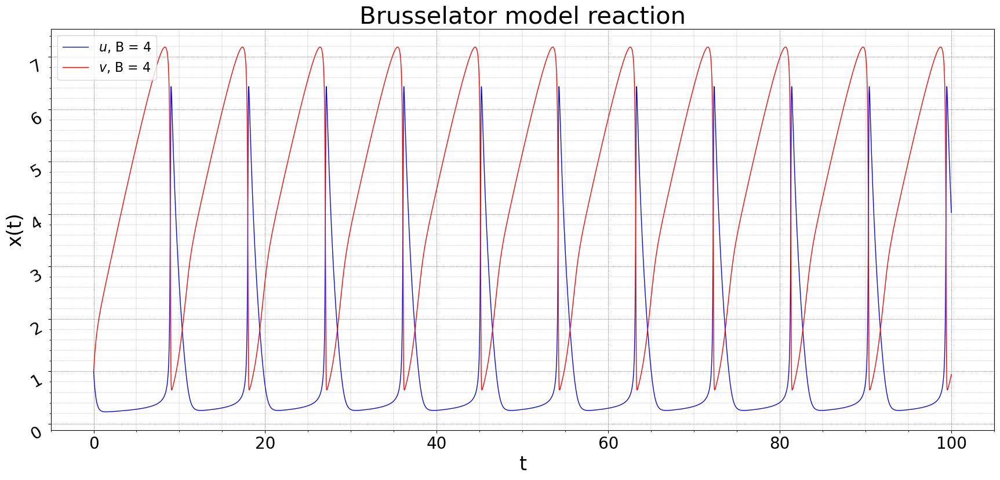

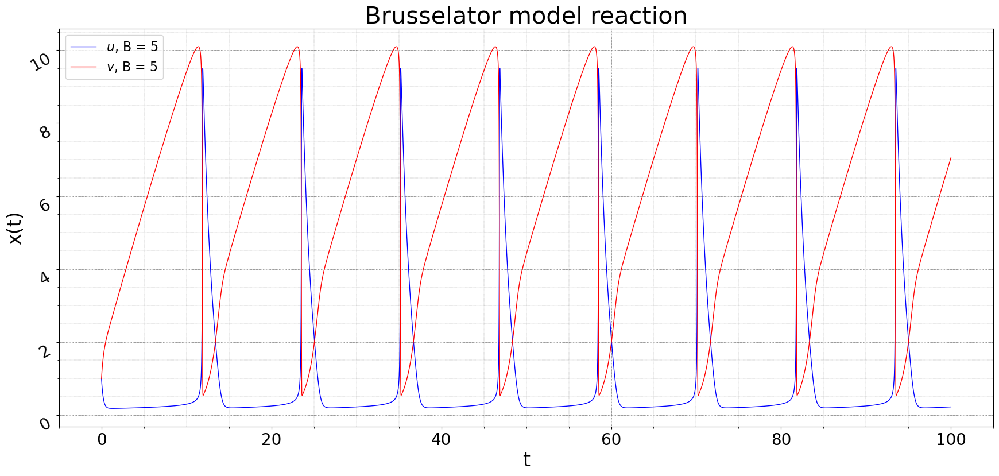

In [18]:
a = [[0.0, 0.0, 0.0, 0.0],
     [0.5, 0.0, 0.0, 0.0],
     [0.0, 0.5, 0.0, 0.0],
     [0.0, 0.0, 1.0, 0.0]]
b = np.array([1.0/6.0, 1.0/3.0, 1.0/3.0, 1.0/6.0])
c = np.array([0.0, 0.5, 0.5, 1.0])

for elem in B:
    f = lambda t, x: np.array([A + x[0]**2 * x[1] - (elem + 1) * x[0], elem * x[0] - x[0]**2 * x[1]])
    t, x = Runge_Kutta(f, x_0, t_1, t_2, N, a, b, c)
    draw(t, x, elem)

# Решение системы методами Адамса

## 2 порядок

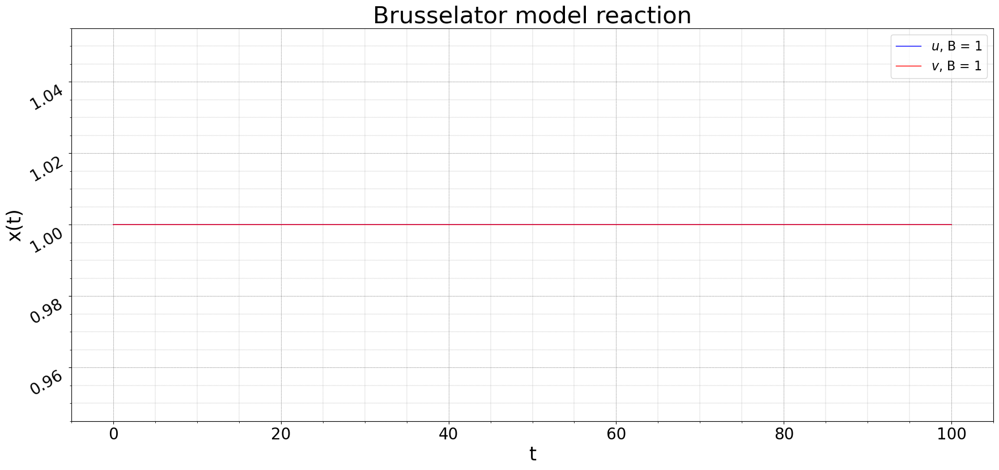

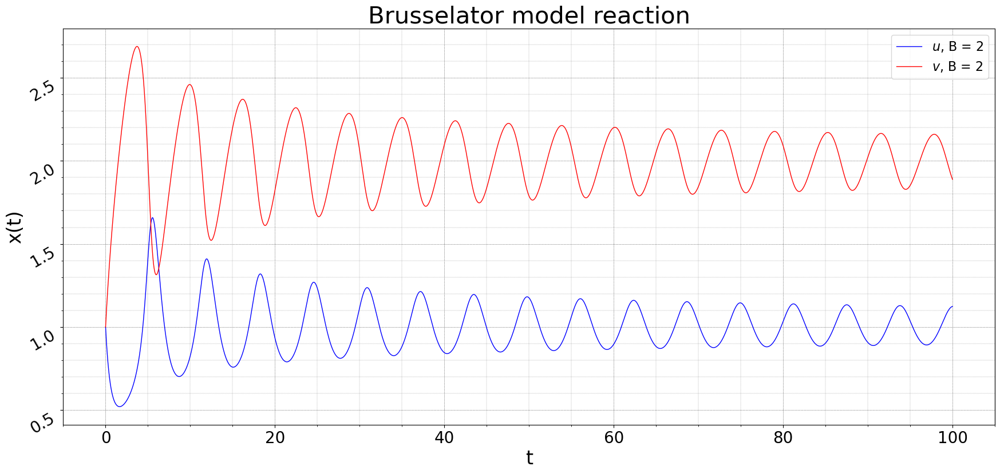

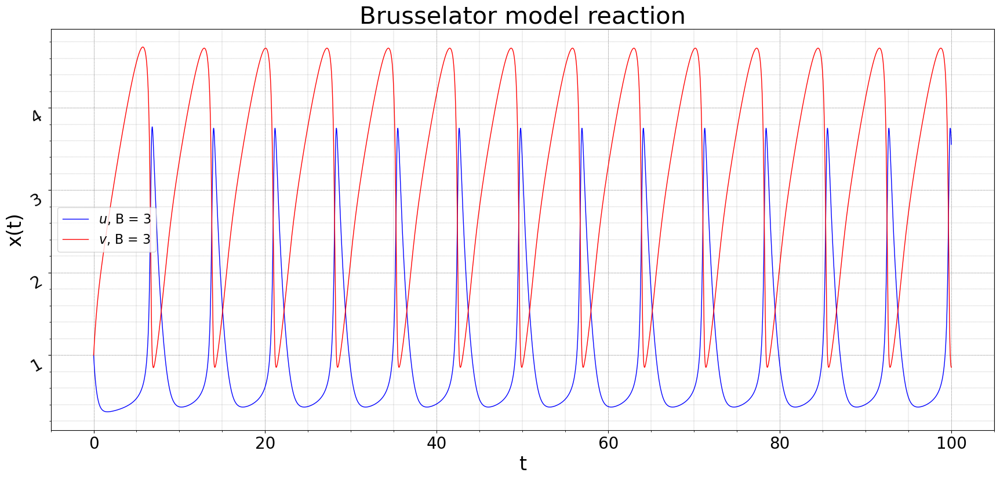

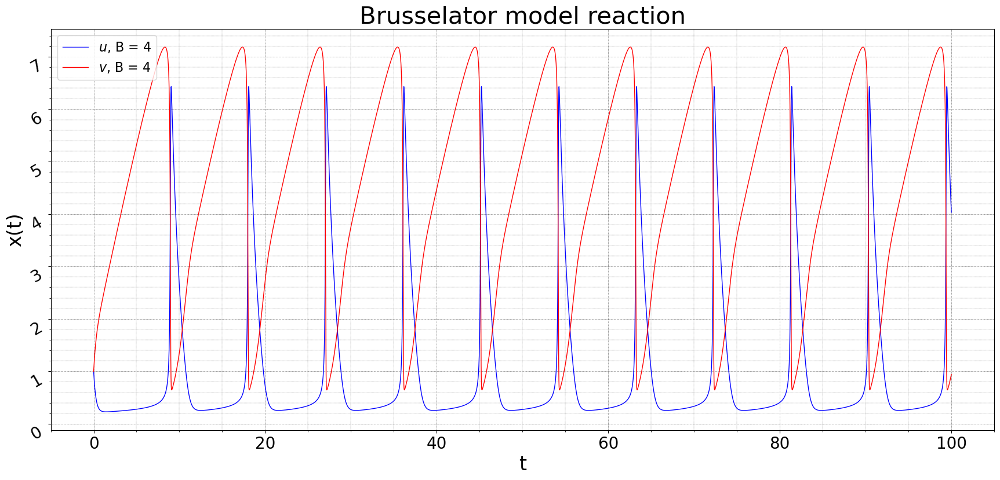

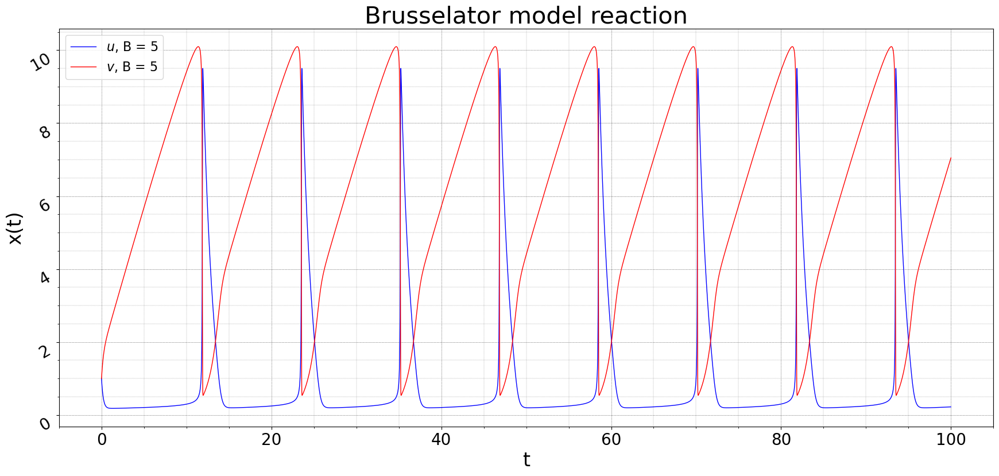

In [21]:
for elem in B:
    f = lambda t, x: np.array([A + x[0]**2 * x[1] - (elem + 1) * x[0], elem * x[0] - x[0]**2 * x[1]])
    _, x = Runge_Kutta(f, x_0, t_1, t_2, N, a, b, c)
    x = x.T
    t, x = Adams(f, [x_0, x[0]], t_1, t_2, N, 2)
    draw(t, x, elem)

## 3 порядок

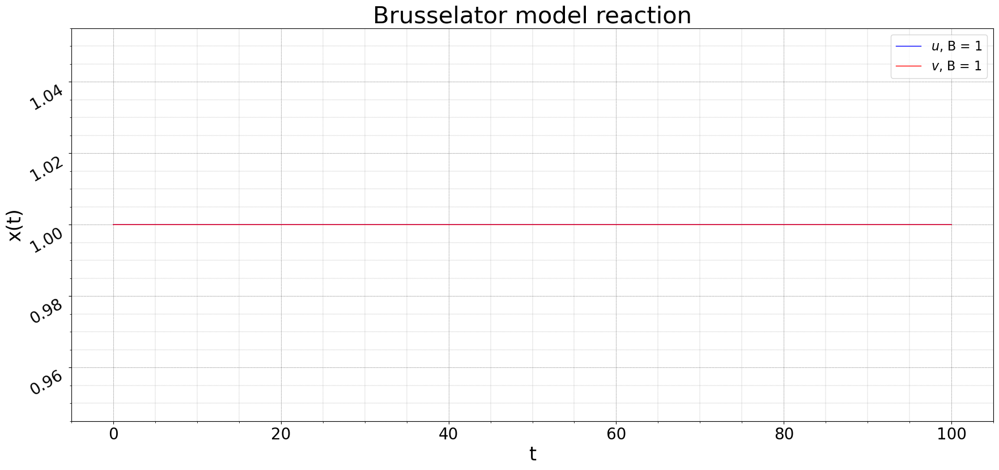

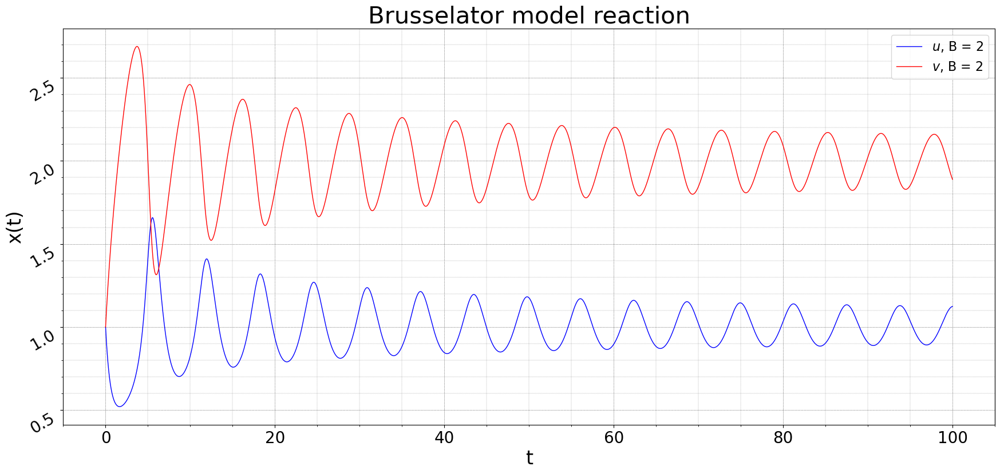

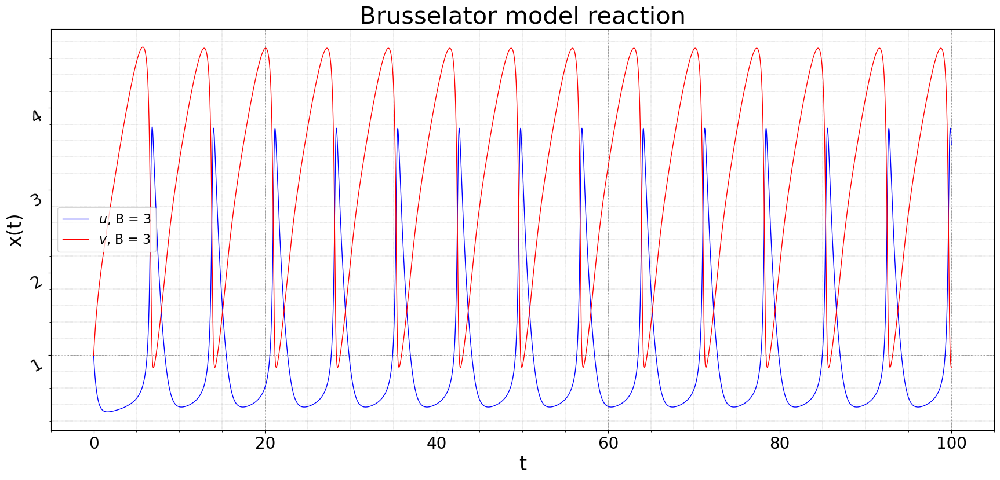

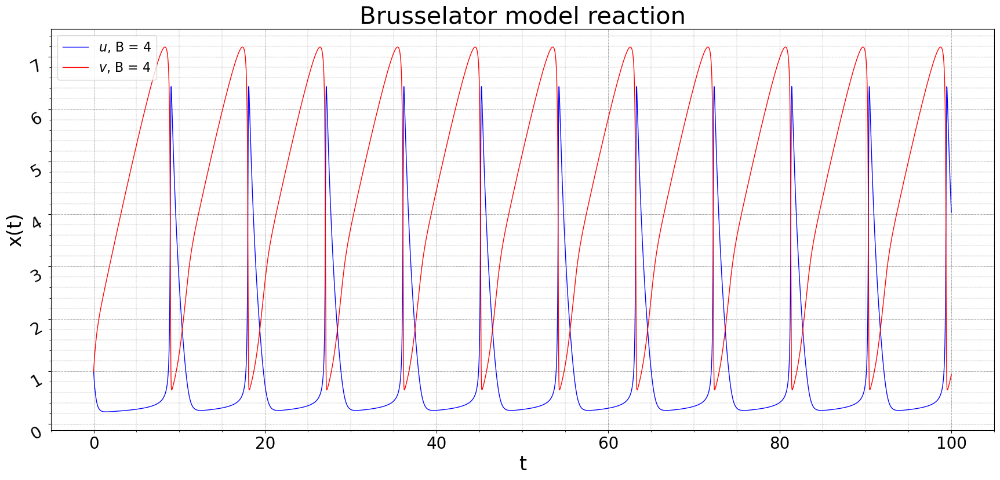

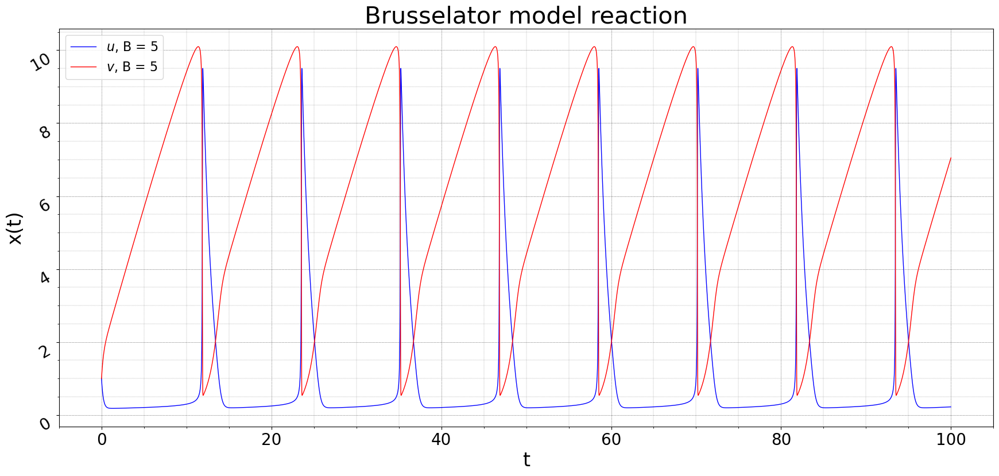

In [23]:
for elem in B:
    f = lambda t, x: np.array([A + x[0]**2 * x[1] - (elem + 1) * x[0], elem * x[0] - x[0]**2 * x[1]])
    _, x = Runge_Kutta(f, x_0, t_1, t_2, N, a, b, c)
    x = x.T
    t, x = Adams(f, [x_0, x[0], x[1]], t_1, t_2, N, 3)
    draw(t, x, elem)

## 4 порядок

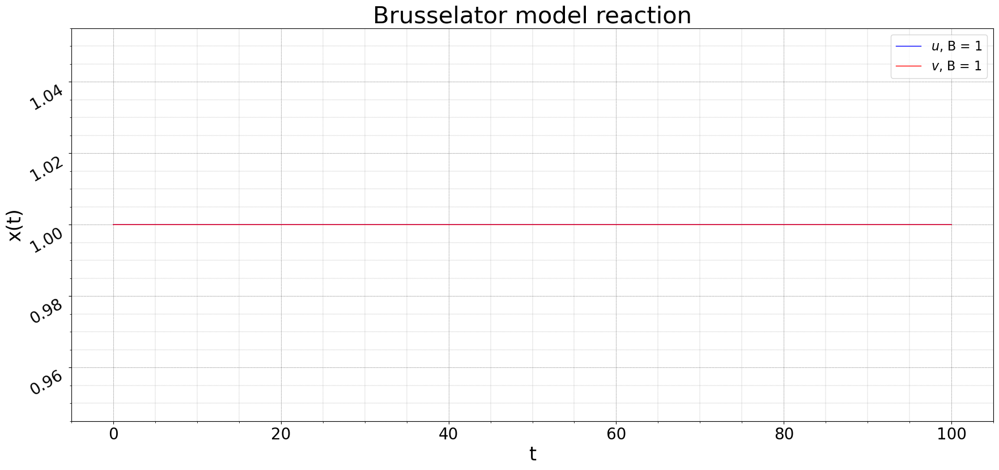

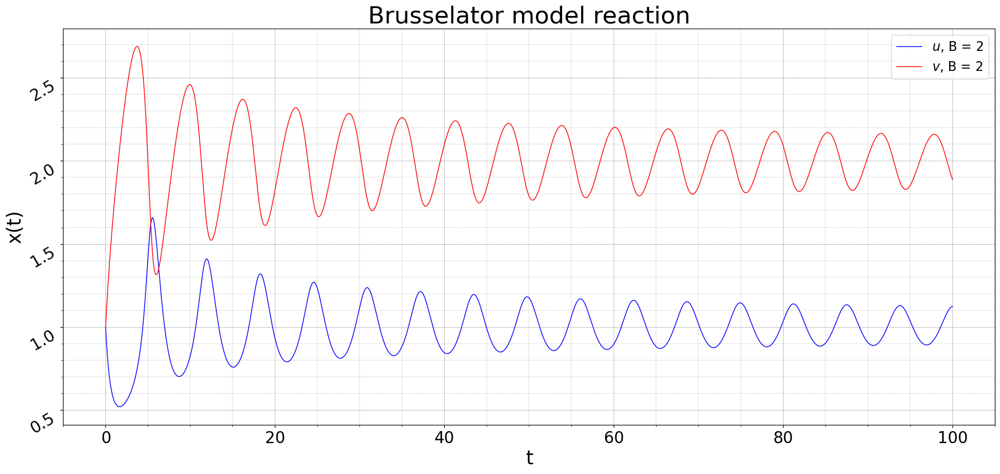

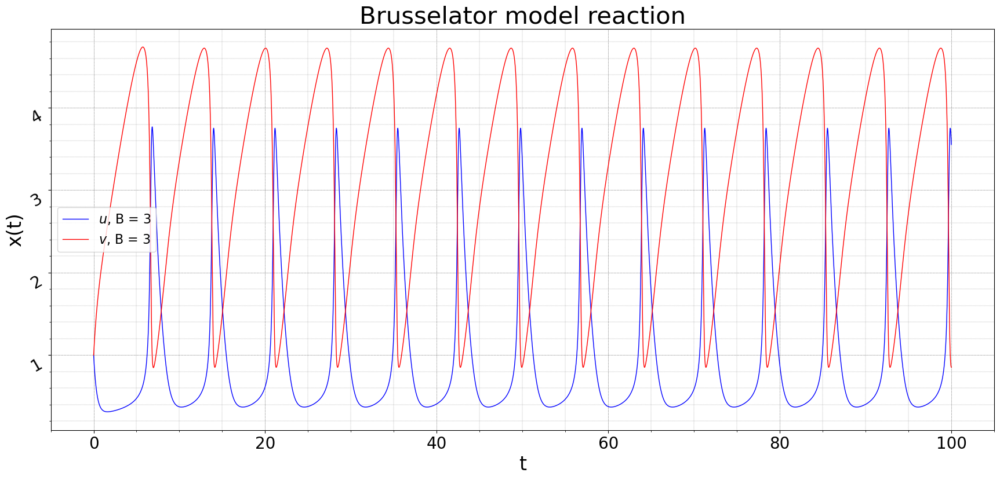

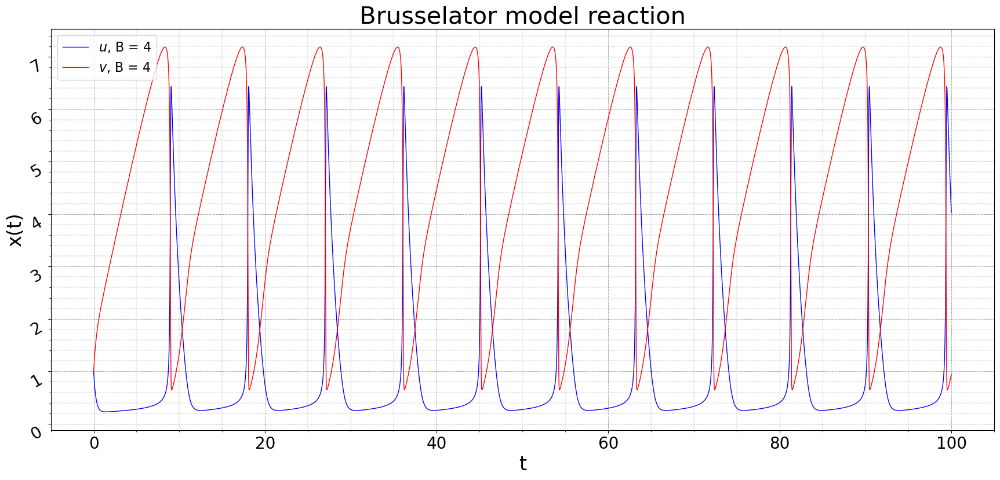

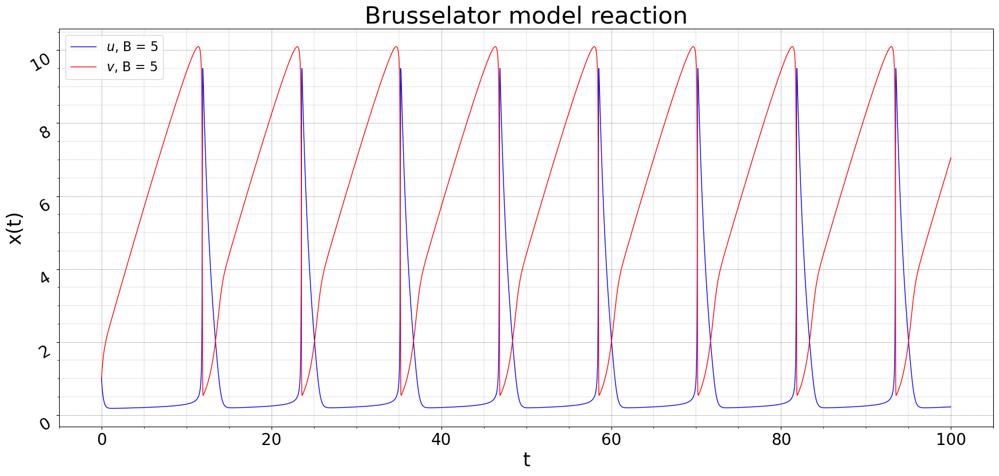

In [25]:
for elem in B:
    f = lambda t, x: np.array([A + x[0]**2 * x[1] - (elem + 1) * x[0], elem * x[0] - x[0]**2 * x[1]])
    _, x = Runge_Kutta(f, x_0, t_1, t_2, N, a, b, c)
    x = x.T
    t, x = Adams(f, [x_0, x[0], x[1], x[2]], t_1, t_2, N, 4)
    draw(t, x, elem)

# Решение системы при помощи ФДН

## 2 порядок

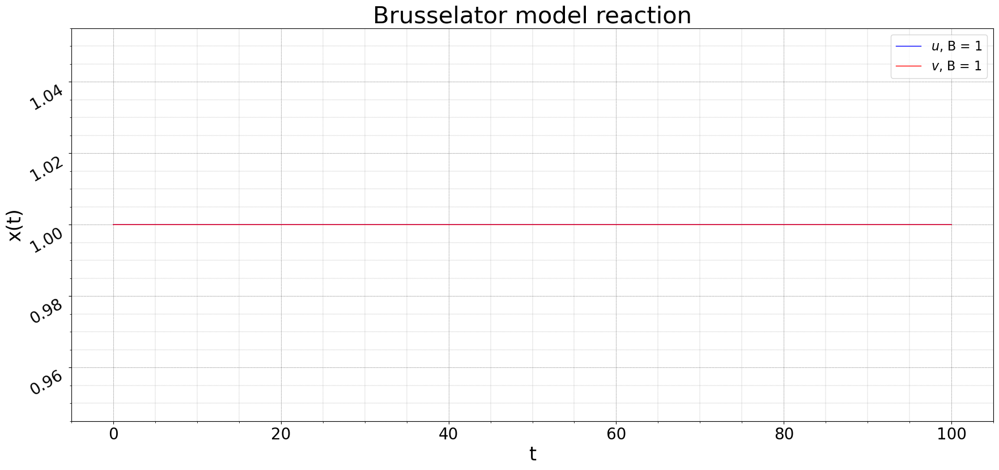

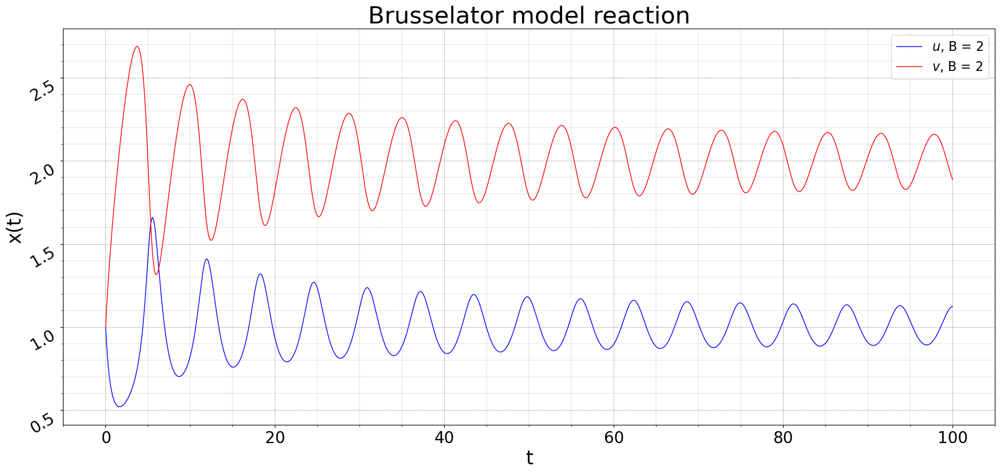

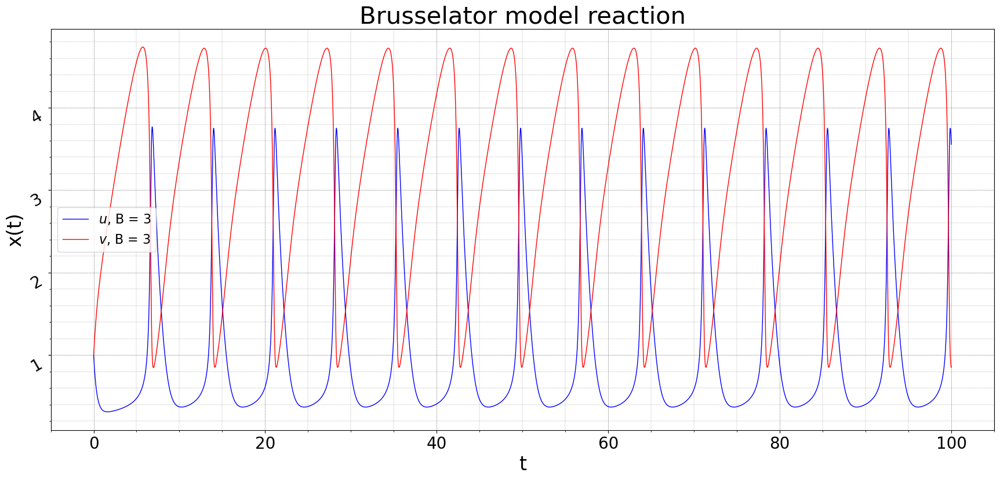

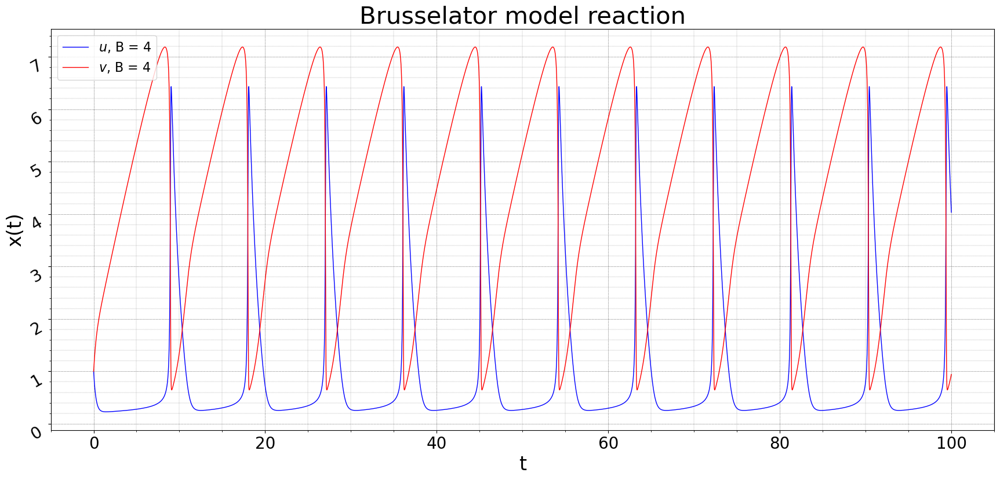

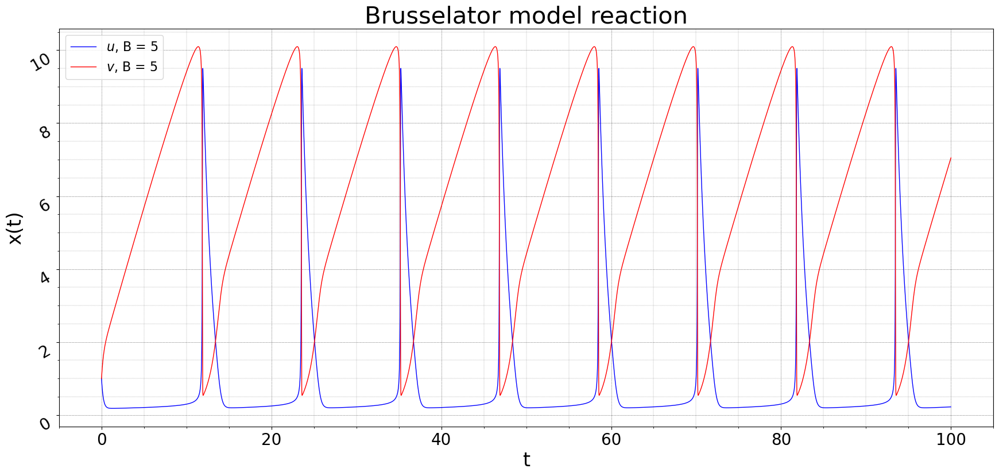

In [28]:
for elem in B:
    f = lambda t, x: np.array([A + x[0]**2 * x[1] - (elem + 1) * x[0], elem * x[0] - x[0]**2 * x[1]])
    _, x = Runge_Kutta(f, x_0, t_1, t_2, N, a, b, c)
    x = x.T
    t, x = BDF(f, [x_0, x[0]], t_1, t_2, N, 2)
    draw(t, x, elem)

## 3 порядок

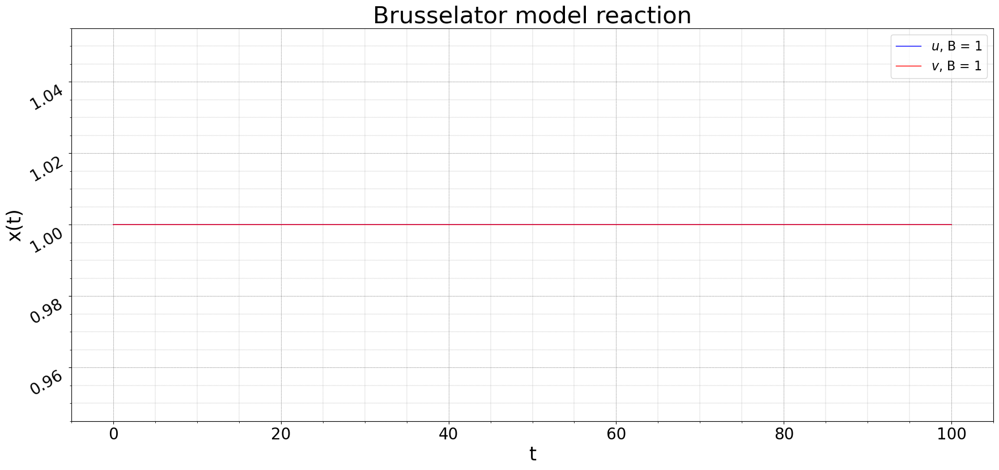

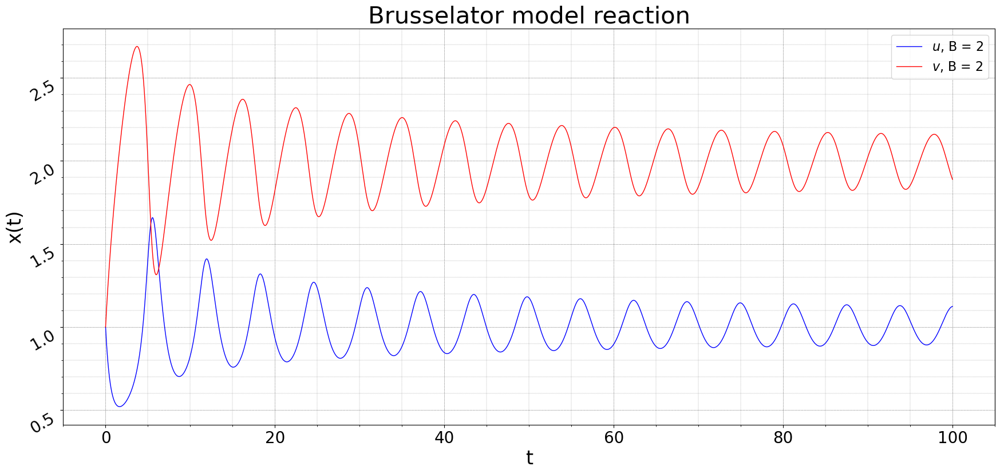

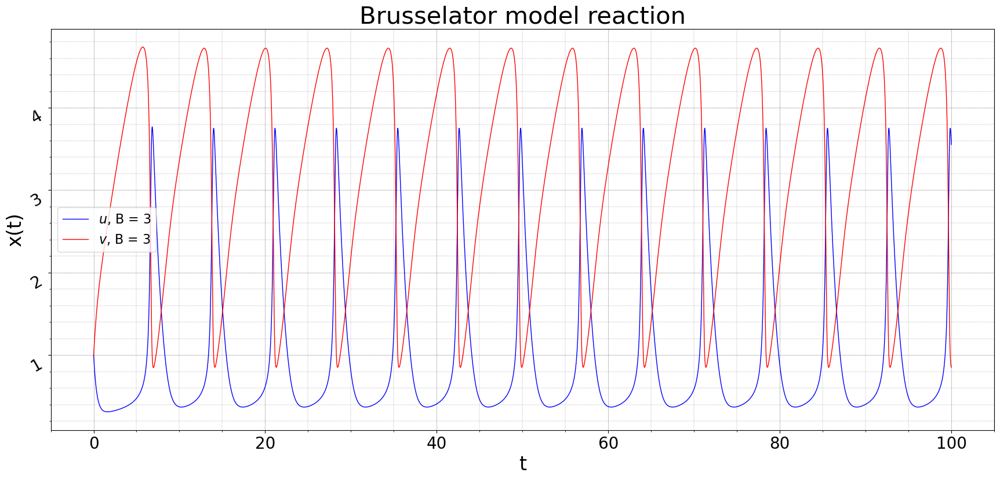

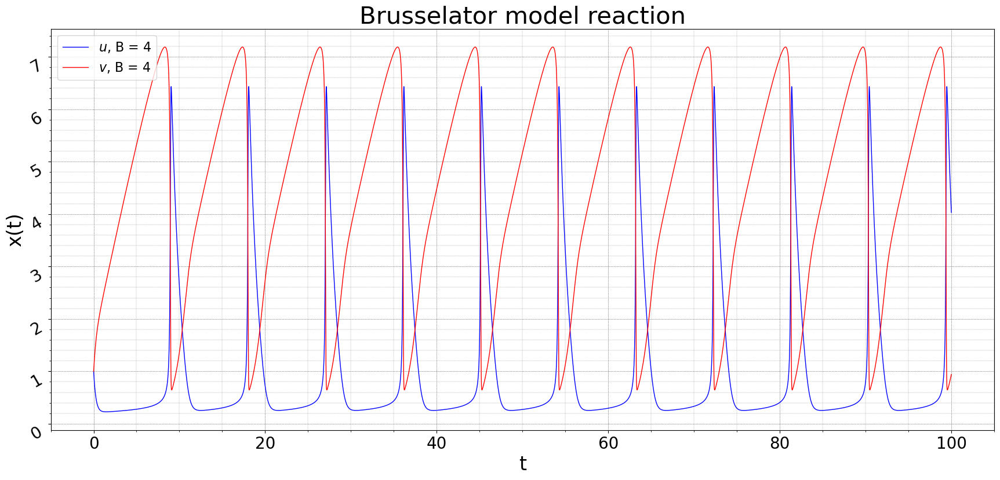

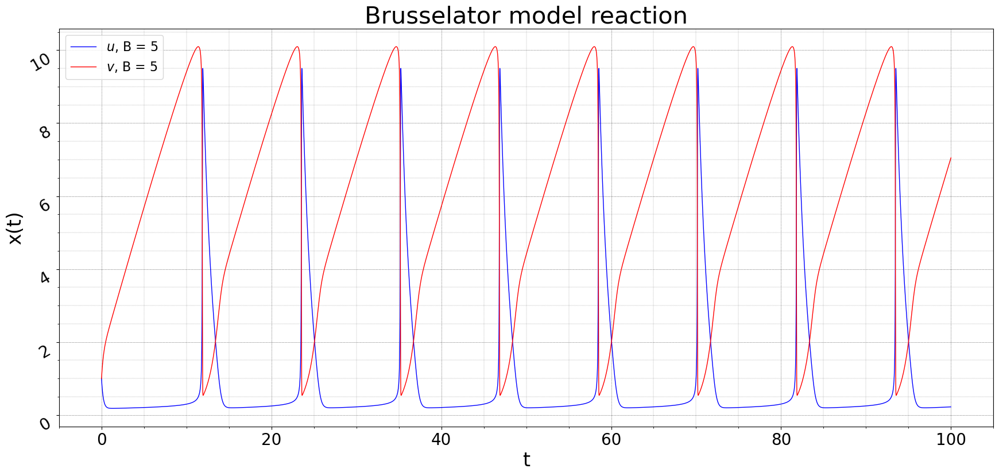

In [30]:
for elem in B:
    f = lambda t, x: np.array([A + x[0]**2 * x[1] - (elem + 1) * x[0], elem * x[0] - x[0]**2 * x[1]])
    _, x = Runge_Kutta(f, x_0, t_1, t_2, N, a, b, c)
    x = x.T
    t, x = BDF(f, [x_0, x[0], x[1]], t_1, t_2, N, 3)
    draw(t, x, elem)

## 4 порядок

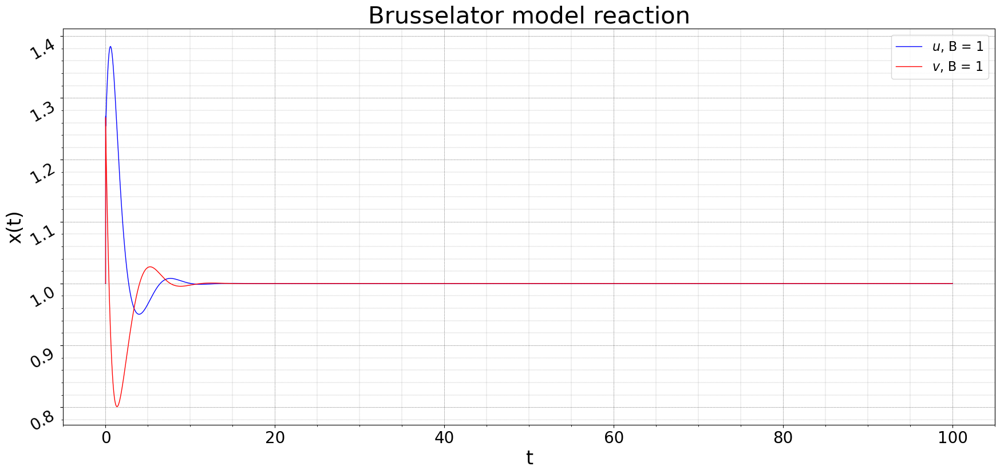

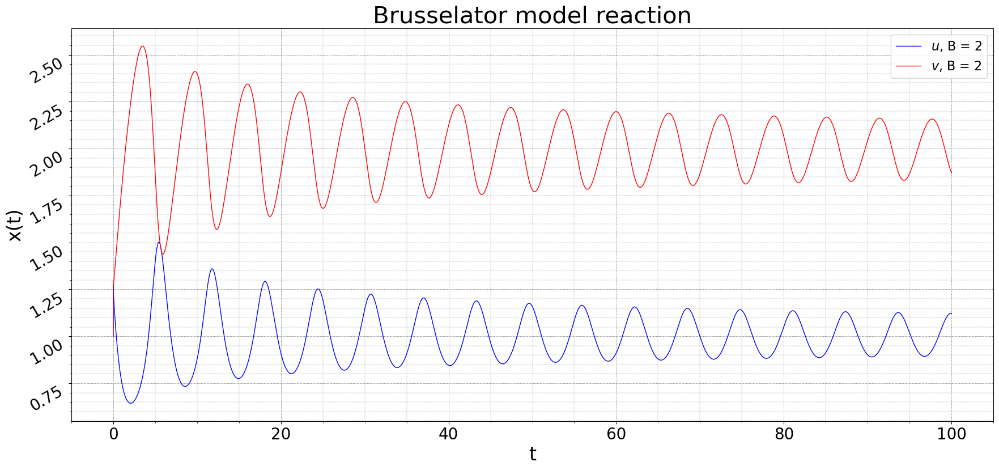

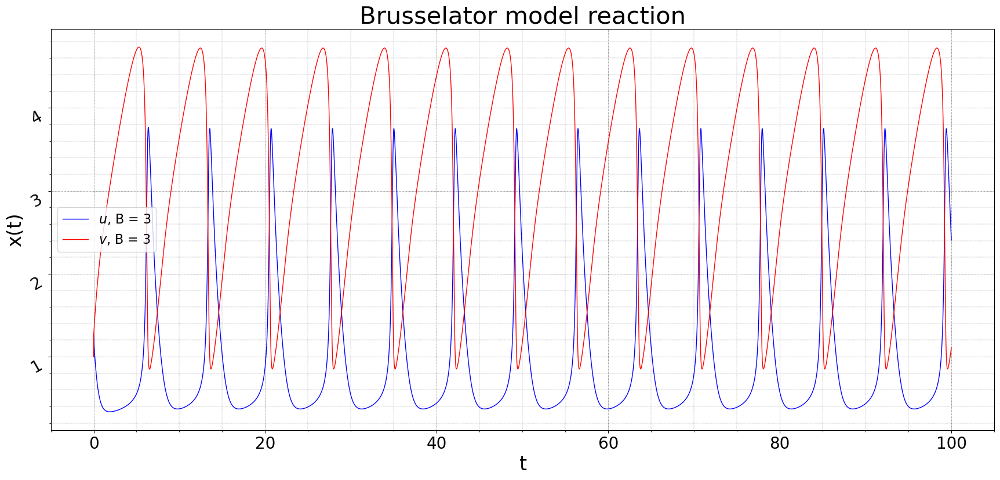

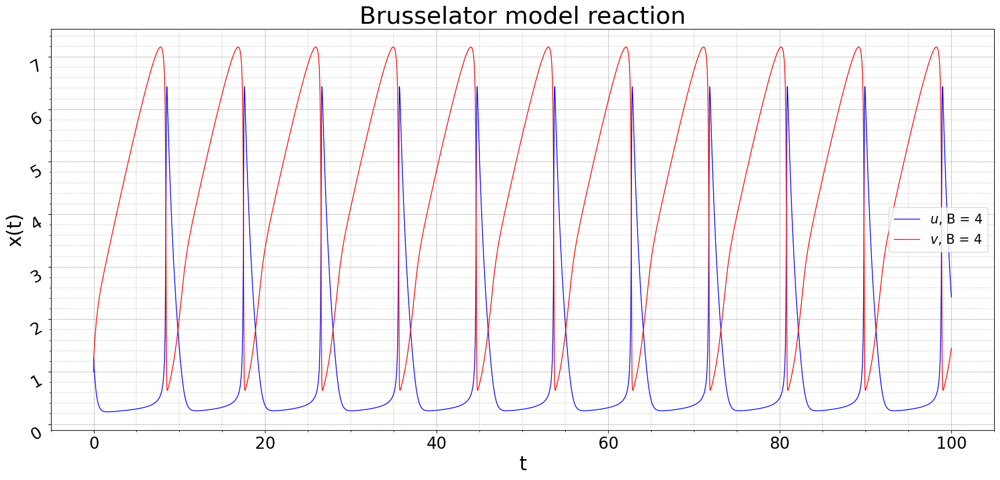

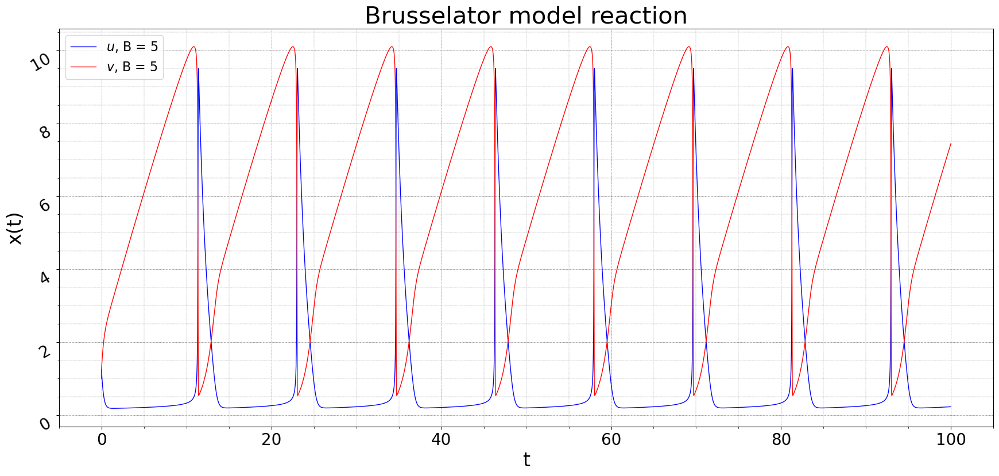

In [32]:
for elem in B:
    f = lambda t, x: np.array([A + x[0]**2 * x[1] - (elem + 1) * x[0], elem * x[0] - x[0]**2 * x[1]])
    _, x = Runge_Kutta(f, x_0, t_1, t_2, N, a, b, c)
    x = x.T
    t, x = BDF(f, [x_0, x[0], x[1], x[2]], t_1, t_2, N, 4)
    draw(t, x, elem)